## Augmentation of Data

Before we begin training, it is important to understand the augmentation that the data will under go. 

The data is passed in as Audio data, which is can be augmented. It is then turned into a spectrogram or mel spectrogram, which as an image can be augmented further. 

This notebook will include forms of augmentation for Audio and Images data files. 

In [3]:
import librosa
import librosa.display

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path
from IPython.display import Audio

Data Augmentations for audio is quite different from those for images. There are two types of augmentations:

- Augmentations for waveform
- Augmentations for spectrogram/melspectrogram

Augmentation for waveform is applied to raw 1D signal, and changes how it sounds like, so we can check how it alters the signal by listening it. On the other hand, augmentation for spectrogram is something similar to image augmentation. However, spectrogram has some big differences from natural image. One of the biggest difference is that it has axis - time axis and frequency axis. Applying augmentations that ignores this axis (Flip, Rotation, etc...) is nonsense.

In [5]:
df = pd.read_csv('train_folds.csv')
y,sr = librosa.load(f'../New_Wavs_CD/{df.iloc[1].recording_id}.wav', sr=None)

In [6]:
Audio(y, rate=sr)

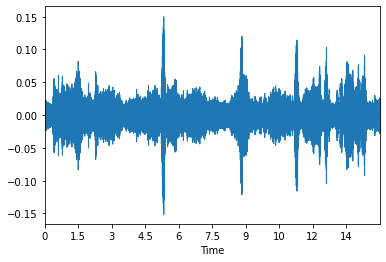

In [8]:
librosa.display.waveplot(y, sr=sr);

D:\ProgramFiles\anaconda3\envs\pytorch\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
D:\ProgramFiles\anaconda3\envs\pytorch\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


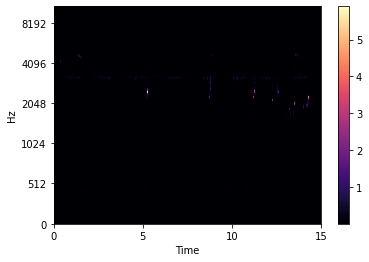

In [9]:
melspec = librosa.feature.melspectrogram(y, sr=sr, n_mels=128)
librosa.display.specshow(melspec, sr=sr, x_axis="time", y_axis="mel")
plt.colorbar();

We can't see much here, so we can convert a power spectrogram (amplitude squared) to decibel (dB) units 

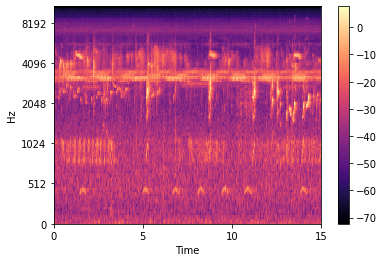

In [10]:
melspec = librosa.power_to_db(librosa.feature.melspectrogram(y, sr=sr, n_mels=128))
librosa.display.specshow(melspec, sr=sr, x_axis="time", y_axis="mel")
plt.colorbar();

We will now apply several augmentations and check the results by via listening or visualising the results. 

We Can use Audiomentations to add augmentations to the raw signal of the audio file. 
The augmentation include:
- GuassianNoise
- GaussianSNR
- Gain
- Pitch shift

There are more and you can read about them at: https://github.com/iver56/audiomentations

In [11]:
import audiomentations as AA

## Gaussian Noise

In [12]:
train_audio_transform = AA.Compose([
    AA.AddGaussianNoise(p=1.)#p is a percentage of the time to apply the augmentation
])
y_gaussian_added = train_audio_transform(y,sample_rate=sr)
Audio(y_gaussian_added, rate=sr)

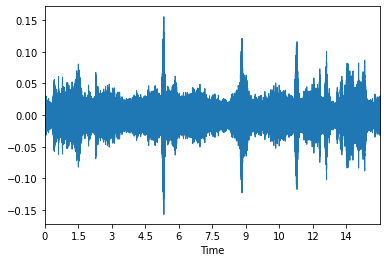

In [77]:
librosa.display.waveplot(y_gaussian_added, sr=sr);

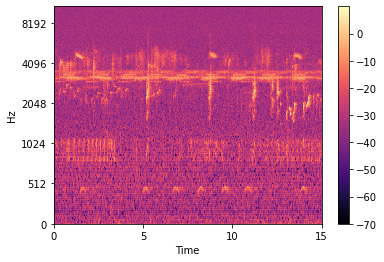

In [78]:
melspec = librosa.power_to_db(librosa.feature.melspectrogram(y_gaussian_added, sr=sr, n_mels=320))
librosa.display.specshow(melspec, sr=sr, x_axis="time", y_axis="mel")
plt.colorbar();

## Gaussian NoiseSNR

In [89]:
train_audio_transform = AA.Compose([
    AA.AddGaussianSNR(p=1.)#p is a percentage of the time to apply the augmentation
])
y_gaussiansnr_added = train_audio_transform(y,sample_rate=sr)
Audio(y_gaussiansnr_added, rate=sr)

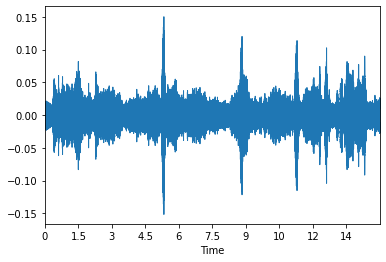

In [86]:
librosa.display.waveplot(y_gaussiansnr_added, sr=sr);

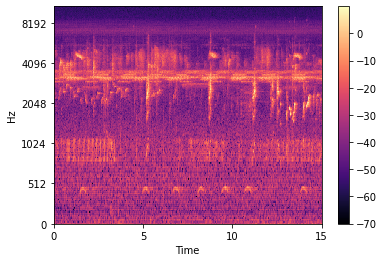

In [88]:
melspec = librosa.power_to_db(librosa.feature.melspectrogram(y_gaussiansnr_added, sr=sr, n_mels=320))
librosa.display.specshow(melspec, sr=sr, x_axis="time", y_axis="mel")
plt.colorbar();

## Stacked Augmentations
We stack Augmentation effects on the audio signal

In [92]:
train_audio_transform = AA.Compose([
    AA.AddGaussianNoise(p=1.),
    AA.AddGaussianSNR(p=1.),
    AA.Gain(p=1.)
    #p is a percentage of the time to apply the augmentation
])
y_stacked = train_audio_transform(y,sample_rate=sr)
Audio(y_stacked, rate=sr)

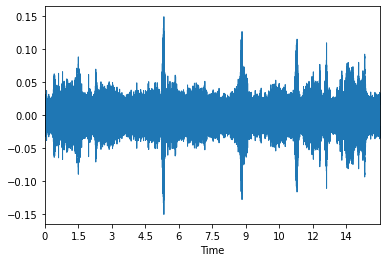

In [93]:
librosa.display.waveplot(y_stacked, sr=sr);

/home/david/anaconda3/envs/fastai4/lib/python3.7/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/home/david/anaconda3/envs/fastai4/lib/python3.7/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


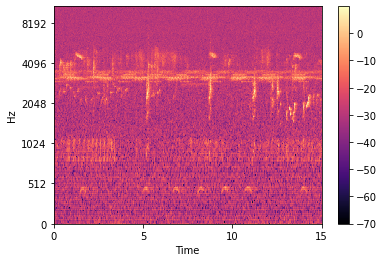

In [94]:
melspec = librosa.power_to_db(librosa.feature.melspectrogram(y_stacked, sr=sr, n_mels=320))
librosa.display.specshow(melspec, sr=sr, x_axis="time", y_axis="mel")
plt.colorbar();

## Pink Noise

A popular augmentation fopr audio is called pink noise, which wis noise with a gradual decrease in noise intensity from low frequency to low frequency bands. The noise in the natural world is said to be such noise.

We use the Colored  Noise library to add this effect

In [13]:
import colorednoise as cn

def pink_noise(y, min_snr = 5., max_snr = 20.0):
    snr = np.random.uniform(min_snr, max_snr)
    a_signal = np.sqrt(y ** 2).max()
    a_noise = a_signal / (10 ** (snr / 20))
    pink_noise = cn.powerlaw_psd_gaussian(1, len(y))
    a_pink = np.sqrt(pink_noise ** 2).max()
    augmented = (y + pink_noise * 1 / a_pink * a_noise).astype(y.dtype)
    return augmented

In [14]:
y_pink = pink_noise(y)
Audio(y_pink,rate=sr)

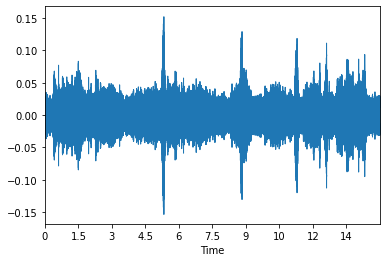

In [102]:
librosa.display.waveplot(y_pink, sr=sr);

/home/david/anaconda3/envs/fastai4/lib/python3.7/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/home/david/anaconda3/envs/fastai4/lib/python3.7/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


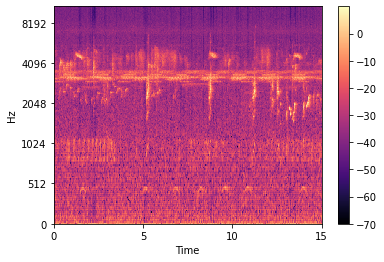

In [103]:
melspec = librosa.power_to_db(librosa.feature.melspectrogram(y_stacked, sr=sr, n_mels=320))
librosa.display.specshow(melspec, sr=sr, x_axis="time", y_axis="mel")
plt.colorbar();

## Adding Background Noise

We can also add background noises ontop of the audio signal if we do not want to add generated noise

In [104]:
train_audio_transform = AA.Compose([
    AA.AddBackgroundNoise('../pink_noise', p=1.) #Change this to rain on the windows machine
    #p is a percentage of the time to apply the augmentation
])
y_back = train_audio_transform(y,sample_rate=sr)
Audio(y_back, rate=sr)

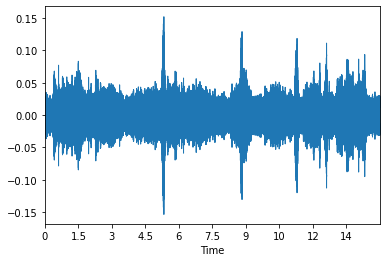

In [105]:
librosa.display.waveplot(y_pink, sr=sr);

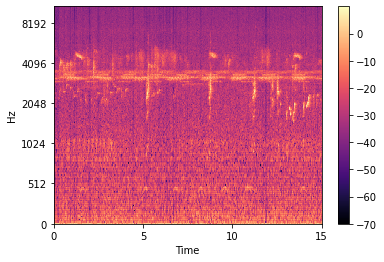

In [106]:
melspec = librosa.power_to_db(librosa.feature.melspectrogram(y_stacked, sr=sr, n_mels=320))
librosa.display.specshow(melspec, sr=sr, x_axis="time", y_axis="mel")
plt.colorbar();

## Image Augmentations

As we convert the audio signal into an image via a mel spectrogram, we can add additional augmentations to the final melspectorgram. 
These augmenations can include, rotation, warping, chaning the histogram, blurring the image etc. 

We use a library called Albumnations, where many of the augmentations can be found here: https://github.com/albumentations-team/albumentations

In [15]:
import albumentations as A

In [16]:
melspec =librosa.power_to_db(librosa.feature.melspectrogram(y, sr=sr, n_mels=510))

D:\ProgramFiles\anaconda3\envs\pytorch\lib\site-packages\librosa\filters.py:239: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  "Empty filters detected in mel frequency basis. "


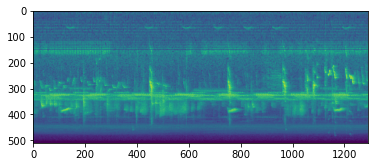

In [130]:
plt.imshow(melspec)

## Guassian Noise

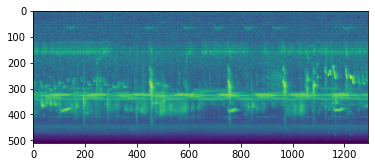

In [137]:
img_transform = A.Compose([
            A.GaussianBlur(p=1.)
])
mel = img_transform(image = melspec)
plt.imshow(mel['image'])

## Random Crop
This a random crop of the image, which can be good to use and bolser scores

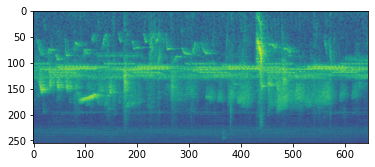

In [145]:
h,w= melspec.shape;w,h
img_transform = A.Compose([
            A.RandomCrop(width = w//2, height=h//2, p=1.)
])
mel = img_transform(image = melspec)
plt.imshow(mel['image'])

## Stacked Augmentations

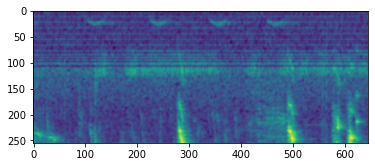

In [151]:
h,w= melspec.shape;w,h
img_transform = A.Compose([
            A.RandomCrop(width = w//2, height=h//2, p=1.),
            A.GaussianBlur(p=1.)
])
mel = img_transform(image = melspec)
plt.imshow(mel['image'])

## CutOut

This is a popular augmentation that has shown to increase scores of image classification models

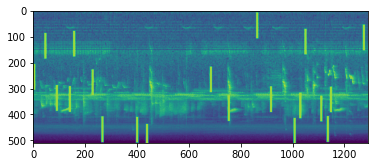

In [173]:
h,w= melspec.shape;w,h
img_transform = A.Compose([
            A.Cutout(max_h_size=100, max_w_size=10,num_holes=20,),
])
mel = img_transform(image = melspec)
plt.imshow(mel['image'])

# Fin